In [10]:
#import some tools that we will use
import skimage.io
import skimage.measure
import numpy
import matplotlib.pyplot as plt
import cellpose.plot
import generate_nuclear_mask

In [11]:
#define paths to image and segmentation directory (directory unused??)
DAPI_image_path = "C:\\Users\\finne\\Documents\\python\\MaxProjections\\AssayPlate_PerkinElmer_CellCarrier-384_B07_T0001F007L01A01ZXXC01_maximum_projection.png"
nuclear_mask_dir = "C:\\Users\\finne\\Documents\\python\\seg_results\\"

# DAPI_image_path = "/Users/kevin/Dropbox/TestImages/MIPs/AssayPlate_PerkinElmer_CellCarrier-384_B07_T0001F006L01A01ZXXC01_maximum_projection.png"
# nuclear_mask_dir = "/Users/kevin/Desktop/generate_nuclear_mask_output/"

In [12]:
#import and segment image
DAPI_image = skimage.io.imread(DAPI_image_path)

nuclear_mask = generate_nuclear_mask.GenerateNuclearMaskJob(DAPI_image_path, nuclear_mask_dir, 100)
segmentation_result = nuclear_mask.cellpose_filtered

distinct_labels_set = set()
for labels_row in segmentation_result:
    for label in labels_row:
        distinct_labels_set.add(label)
distinct_labels_set.remove(0)
distinct_labels = [label for label in distinct_labels_set]

>>>> using CPU
Running test snippet to check if MKL-DNN working
see https://pytorch.org/docs/stable/backends.html?highlight=mkl
** MKL version working - CPU version is sped up. **
processing 1 image(s)
time spent: running network 13.99s; flow+mask computation 1.11
estimated masks for 1 image(s) in 15.50 sec
>>>> TOTAL TIME 15.50 sec


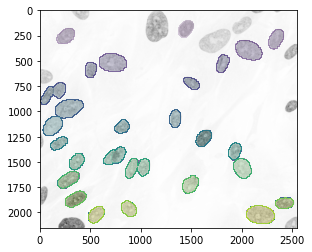

In [13]:
#display the things
plt.imshow(DAPI_image)
contour_result = plt.contourf(segmentation_result, levels=distinct_labels, alpha=0.2)
plt.show()
